In [1]:
import numpy as np
import xarray as xr
import os
import fnmatch
from tqdm.autonotebook import tqdm
import dask
import sys
sys.path.insert(0, '/home/jovyan/CMIP6cf/cmip6cf/')
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
%config InlineBackend.figure_format = 'retina'


/tmp/ipykernel_1525/3363248783.py:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


Load output:

In [2]:
in_dir = '/home/jovyan/CMIP6cf/output/subsetted_forcing/EC-Earth3'
output_files = []

forcing_hist = xr.open_dataset(os.path.join(in_dir,'EC-Earth3_gr_historical_day_r150i1p1f1.nc'))
forcing_ssp = xr.open_dataset(os.path.join(in_dir,'EC-Earth3_gr_ssp245_day_r150i1p1f1.nc'))

forcing = xr.concat((forcing_hist,forcing_ssp),dim='time').isel(member_id=0)


In [3]:
wind = forcing#.mean(dim=['lat_around_tg','lon_around_tg'])

In [4]:
output_yrs = np.arange(2000,2100,20)
window_len=40

if len(np.unique(wind.time.resample(time='1Y').count()))>1: #remove leap days so that each computation window has the same length
            with dask.config.set(**{'array.slicing.split_large_chunks': True}):
                wind = wind.sel(time=~((wind.time.dt.month == 2) & (wind.time.dt.day == 29))) #^probably (hopefully) only has a small effect on the results
        
#select DJF:
days_in_year = int(wind.time.resample(time='1Y').count()[0])

if window_len%2 !=0: #odd
    window_start_idx = days_in_year*(output_yrs-1970-int(np.floor(window_len/2)))
    first_window_idx = np.arange(0*days_in_year,window_len*days_in_year)
else: #even
    window_start_idx = days_in_year*(output_yrs-1970-int(window_len/2)+1)
    first_window_idx = np.arange(0*days_in_year,window_len*days_in_year)

if np.max(first_window_idx[:,np.newaxis]+window_start_idx[np.newaxis,:])>=len(wind.time):
    raise Exception('Windows exceed simulation length.')

window_idx = xr.DataArray( #indices of windows
    data=first_window_idx[:,np.newaxis]+window_start_idx[np.newaxis,:],
    dims=["time_in_window_idx","window"],
    coords=dict(
        time_in_window_idx=first_window_idx,
        window=output_yrs
    ),
)

wind_wdws = wind.isel(time=window_idx)

#check DJF
#idx = [np.where((wind_wdws.time.isel(window=0).dt.month == month)) for month in [1,2,3,10,11,12]]
#season_idx = np.sort(np.hstack(idx)[0])
#wind_wdws = wind_wdws.isel(time_in_window_idx = season_idx)

In [5]:
wind_wdws['sfcWind_threshold'] = wind_wdws.sfcWind.quantile(.97,dim='time_in_window_idx')
wind_wdws['psl_threshold'] = wind_wdws.psl.quantile(.97,dim='time_in_window_idx')


timesteps = xr.DataArray(data=np.arange(len(wind_wdws.window)),dims=['window'],coords=dict(window=wind_wdws.window))

wind_wdws['sfcWind_threshold_slope'] = (1/np.diff(wind_wdws.window)[0])*xr.corr(wind_wdws.sfcWind_threshold,timesteps,dim='window')*wind_wdws.sfcWind_threshold.std(dim='window')/timesteps.std(dim='window')
wind_wdws['psl_threshold_slope'] = (1/np.diff(wind_wdws.window)[0])*xr.corr(wind_wdws.psl_threshold,timesteps,dim='window')*wind_wdws.psl_threshold.std(dim='window')/timesteps.std(dim='window')

In [6]:
wind_wdws.load()

<xarray.Dataset>
Dimensions:                  (time_in_window_idx: 14600, window: 5, tg: 109,
                              lat_around_tg: 2, lon_around_tg: 2)
Coordinates:
    time                     (time_in_window_idx, window) datetime64[ns] 1981...
    member_id                <U10 'r150i1p1f1'
    height                   float64 10.0
    longitude                (tg, lon_around_tg) float64 -1.5 -0.5 ... -6.5 -5.5
    latitude                 (tg, lat_around_tg) float64 45.5 44.5 ... 44.5 43.5
  * tg                       (tg) object 'arcachon_eyrac_.csv' ... 'gijon_gij...
  * lat_around_tg            (lat_around_tg) int64 0 1
  * lon_around_tg            (lon_around_tg) int64 0 1
  * time_in_window_idx       (time_in_window_idx) int64 0 1 2 ... 14598 14599
  * window                   (window) int64 2000 2020 2040 2060 2080
    quantile                 float64 0.97
Data variables:
    sfcWind                  (time_in_window_idx, window, tg, lat_around_tg, lon_around_tg) float32 ...
    psl                      (time_in_window_idx, window, tg, lat_around_tg, lon_around_tg) float32 ...
    sfcWind_threshold        (window, tg, lat_around_tg, lon_around_tg) float64 ...
    psl_threshold            (window, tg, lat_around_tg, lon_around_tg) float64 ...
    sfcWind_threshold_slope  (tg, lat_around_tg, lon_around_tg) float64 -0.00...
    psl_threshold_slope      (tg, lat_around_tg, lon_around_tg) float64 -0.26...
Attributes: (12/56)
    Conventions:                      CF-1.7 CMIP-6.2
    activity_id:                      CMIP
    cmor_version:                     3.4.0
    comment:                          This experiment is part of SMHI's Large...
    contact:                          cmip6-data@ec-earth.org
    creation_date:                    2019-07-06T22:29:31Z
    ...                               ...
    intake_esm_attrs:zstore:          gs://cmip6/CMIP6/CMIP/EC-Earth-Consorti...
    intake_esm_attrs:version:         20200412
    intake_esm_attrs:_data_format_:   zarr
    intake_esm_dataset_key:           CMIP.EC-Earth-Consortium.EC-Earth3.hist...
    original_key:                     EC-Earth3.gr.historical.day.r150i1p1f1
    regrid_method:                    bilinear

**Model mean Kendall's Tau, extreme=surge:**

Using intersection of ssp's for comparison between scenarios:

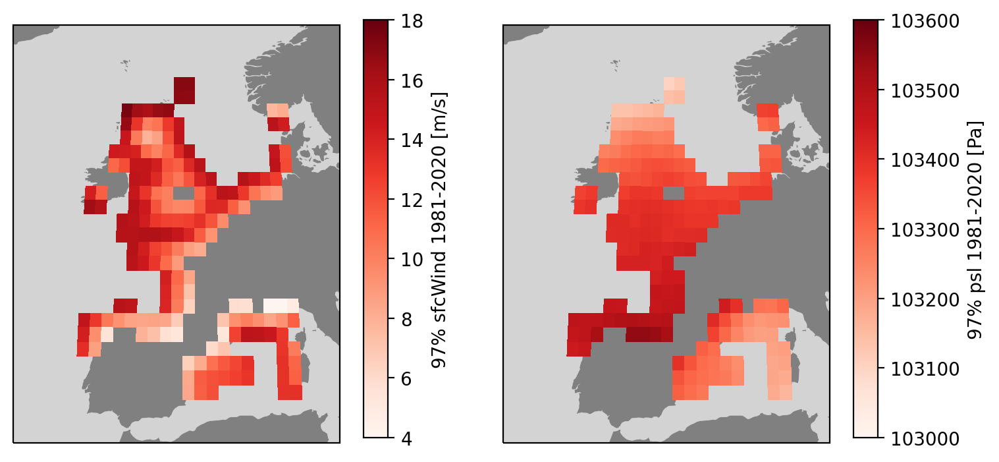

In [7]:

fig=plt.figure(figsize=(8,8)) #generate figure  
gs = fig.add_gridspec(1,2)
gs.update(wspace=.5)
ax = plt.subplot(gs[0,0],projection=ccrs.Robinson(central_longitude=0))
ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

for tg in wind_wdws.tg.values:

    w = ax.pcolor(wind_wdws.sel(tg=tg).sfcWind_threshold.isel(window=0).longitude,wind_wdws.sel(tg=tg).sfcWind_threshold.isel(window=0).latitude,wind_wdws.sel(tg=tg).sfcWind_threshold.isel(window=0),transform=ccrs.PlateCarree(),vmin=4,vmax=18,cmap='Reds')
    

    #sc=ax.scatter(wind.lon,wind.lat,c=ssp_ds.surge_thresholds_slope.isel(quantile=-3).sel(member_id=member),cmap='seismic',vmin=-.002,vmax=.002,s=20,transform=ccrs.PlateCarree(),zorder=3)

ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())


cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
cb=fig.colorbar(w, cax=cax,orientation='vertical',label='97% sfcWind 1981-2020 [m/s]')



ax = plt.subplot(gs[0,1],projection=ccrs.Robinson(central_longitude=0))
ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

for tg in wind_wdws.tg.values:

    w = ax.pcolor(wind_wdws.sel(tg=tg).psl_threshold.isel(window=0).longitude,wind_wdws.sel(tg=tg).psl_threshold.isel(window=0).latitude,wind_wdws.sel(tg=tg).psl_threshold.isel(window=0),transform=ccrs.PlateCarree(),vmin=103000,vmax=103600,cmap='Reds')
    

    #sc=ax.scatter(wind.lon,wind.lat,c=ssp_ds.surge_thresholds_slope.isel(quantile=-3).sel(member_id=member),cmap='seismic',vmin=-.002,vmax=.002,s=20,transform=ccrs.PlateCarree(),zorder=3)

ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())


cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
cb=fig.colorbar(w, cax=cax,orientation='vertical',label='97% psl 1981-2020 [Pa]')

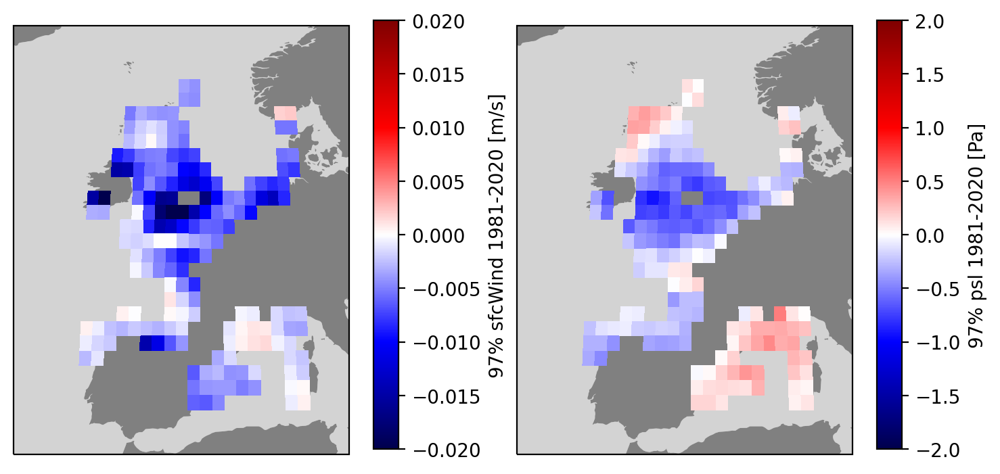

In [8]:

fig=plt.figure(figsize=(8,8)) #generate figure  
gs = fig.add_gridspec(1,2)
gs.update(wspace=.5)
ax = plt.subplot(gs[0,0],projection=ccrs.Robinson(central_longitude=0))
ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

for tg in wind_wdws.tg.values:

    w = ax.pcolor(wind_wdws.sel(tg=tg).sfcWind_threshold.isel(window=0).longitude,wind_wdws.sel(tg=tg).sfcWind_threshold.isel(window=0).latitude,wind_wdws.sel(tg=tg).sfcWind_threshold_slope,transform=ccrs.PlateCarree(),vmin=-.02,vmax=.02,cmap='seismic')
    

    #sc=ax.scatter(wind.lon,wind.lat,c=ssp_ds.surge_thresholds_slope.isel(quantile=-3).sel(member_id=member),cmap='seismic',vmin=-.002,vmax=.002,s=20,transform=ccrs.PlateCarree(),zorder=3)

ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())


cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
cb=fig.colorbar(w, cax=cax,orientation='vertical',label='97% sfcWind 1981-2020 [m/s]')



ax = plt.subplot(gs[0,1],projection=ccrs.Robinson(central_longitude=0))
ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

for tg in wind_wdws.tg.values:

    w = ax.pcolor(wind_wdws.sel(tg=tg).psl_threshold.isel(window=0).longitude,wind_wdws.sel(tg=tg).psl_threshold.isel(window=0).latitude,wind_wdws.sel(tg=tg).psl_threshold_slope,transform=ccrs.PlateCarree(),vmin=-2,vmax=2,cmap='seismic')
    

    #sc=ax.scatter(wind.lon,wind.lat,c=ssp_ds.surge_thresholds_slope.isel(quantile=-3).sel(member_id=member),cmap='seismic',vmin=-.002,vmax=.002,s=20,transform=ccrs.PlateCarree(),zorder=3)

ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())


cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
cb=fig.colorbar(w, cax=cax,orientation='vertical',label='97% psl 1981-2020 [Pa]')

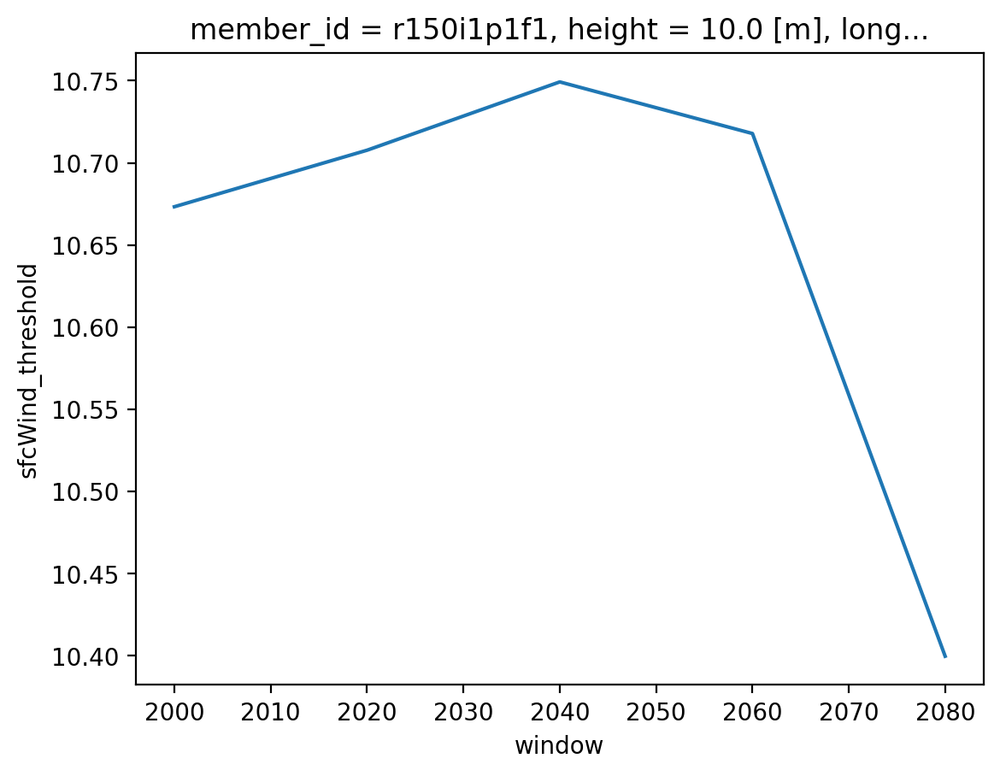

In [10]:
wind_wdws.isel(tg=2).sfcWind_threshold[:,1,0].plot()

In [18]:
(ssp_ds.surge_thresholds.isel(quantile=-1).sel(tg='esbjerg_130121_denmark.csv').isel(window=-1)-ssp_ds.surge_thresholds.isel(quantile=-1).sel(tg='esbjerg_130121_denmark.csv').isel(window=0)).argmin(dim='member_id')

<xarray.DataArray 'surge_thresholds' ()>
array(51)
Coordinates:
    tg            <U26 'esbjerg_130121_denmark.csv'
    quantile      float64 0.99
    source_id     <U15 'EC-Earth3'
    gridcell_lat  float64 55.13
    gridcell_lon  float64 8.75
    lat           float64 55.47
    lon           float64 8.433
    height        float64 10.0
    ssp           <U6 'ssp245'

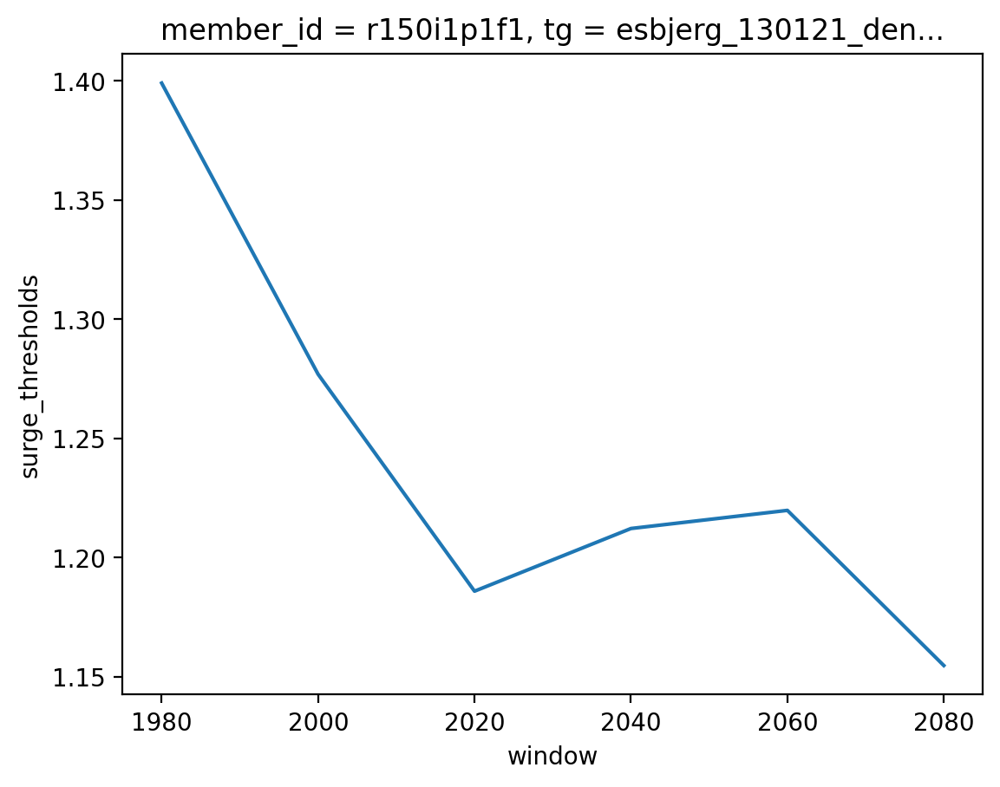

In [20]:
ssp_ds.surge_thresholds.isel(quantile=-3).sel(tg='esbjerg_130121_denmark.csv').isel(member_id=51).plot() #r150i1p1f1

Using all data in each ssp (less easy to compare between scenarios)

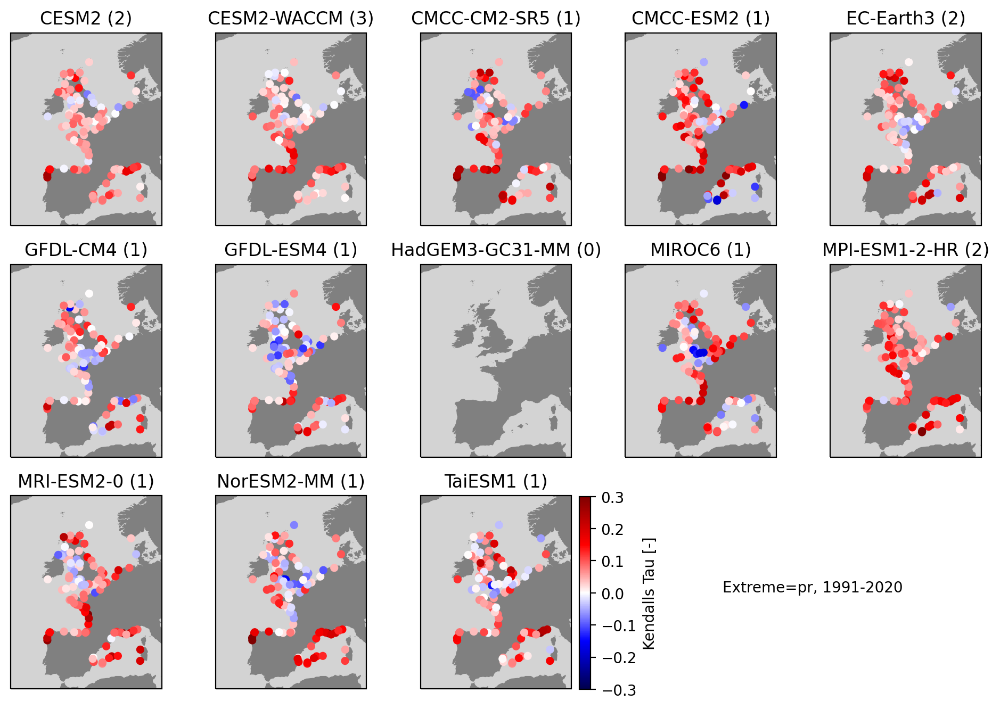

In [8]:
for ssp in ['ssp245']:#ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_present.ktau.sel(source_id=model).sel(statistic='coef',extreme_variate='pr').mean(dim='member_id'),cmap='seismic',vmin=-.3,vmax=.3,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.ktau.sel(source_id=model).isel(tg=0,extreme_variate=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='Kendalls Tau [-]')
            ax.annotate('Extreme=pr, 1991-2020',(2,.5),xycoords='axes fraction')
        

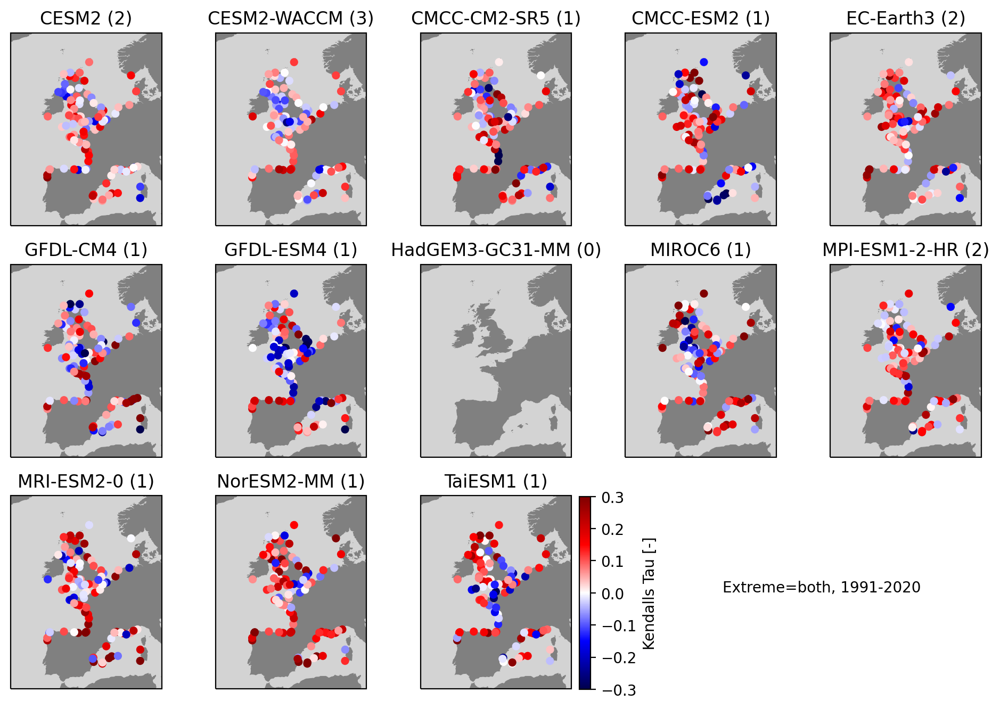

In [9]:
for ssp in ['ssp245']:#ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_present.ktau.sel(source_id=model).sel(statistic='coef',extreme_variate='both').mean(dim='member_id'),cmap='seismic',vmin=-.3,vmax=.3,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.ktau.sel(source_id=model).isel(tg=0,extreme_variate=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='Kendalls Tau [-]')
            ax.annotate('Extreme=both, 1991-2020',(2,.5),xycoords='axes fraction')
        

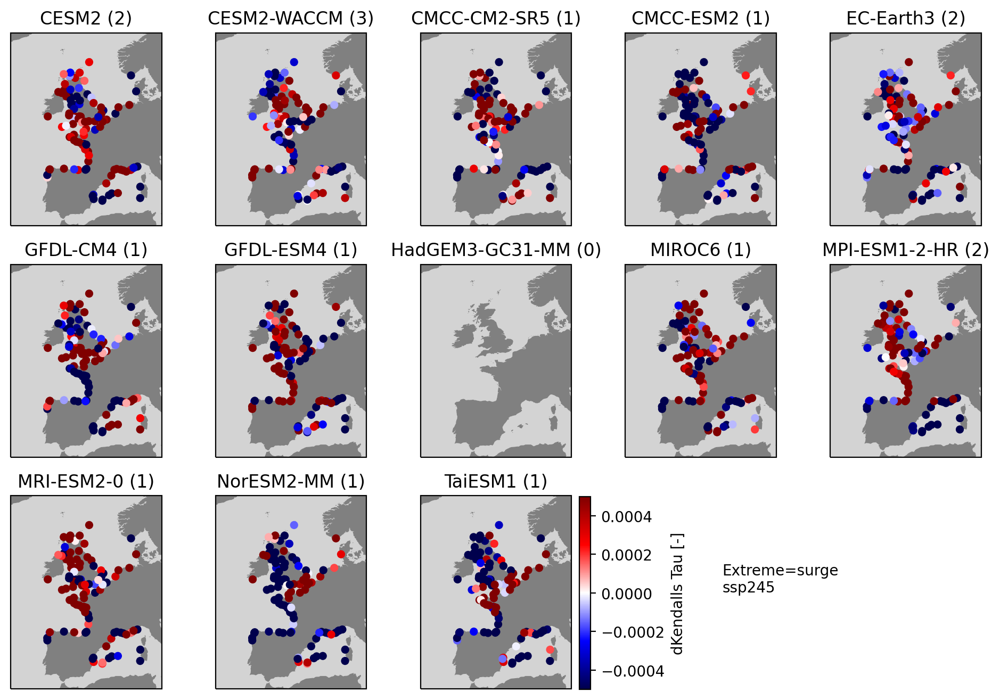

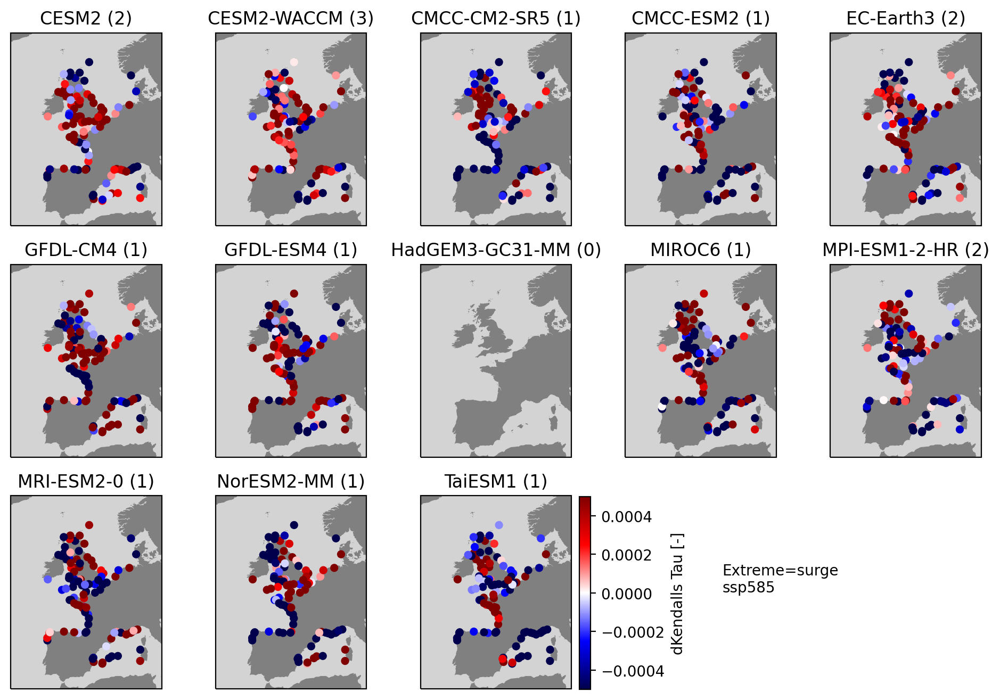

In [10]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.ktau_slope.sel(source_id=model).sel(statistic='coef',extreme_variate='surge').mean(dim='member_id'),cmap='seismic',vmin=-.0005,vmax=.0005,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.ktau.sel(source_id=model).isel(tg=0,extreme_variate=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dKendalls Tau [-]')
            ax.annotate('Extreme=surge\n'+ssp,(2,.5),xycoords='axes fraction')
        

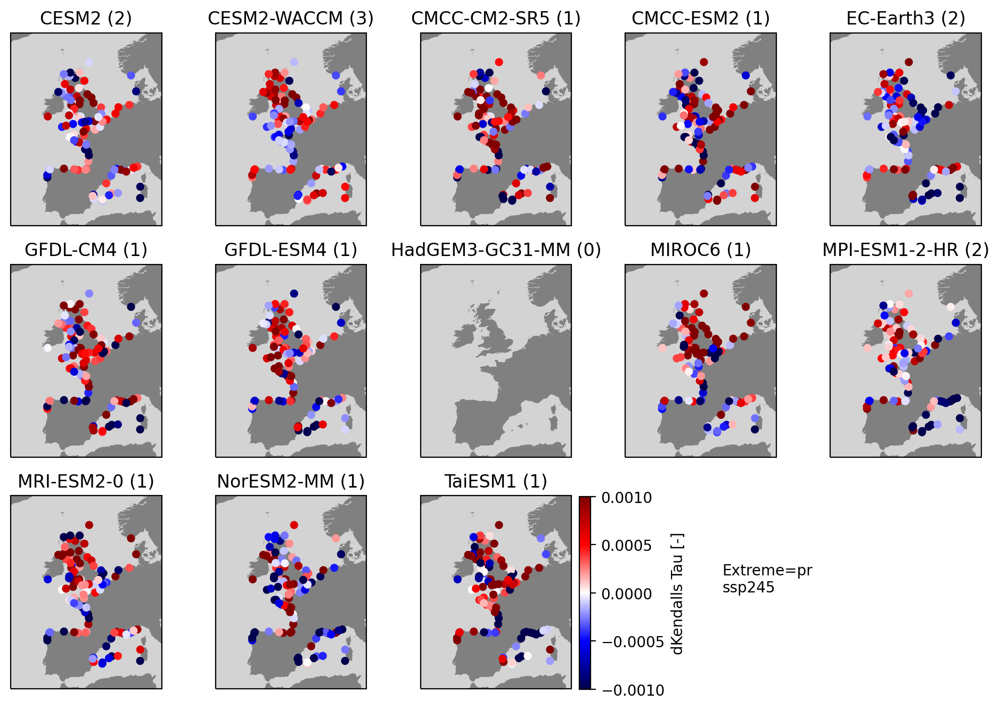

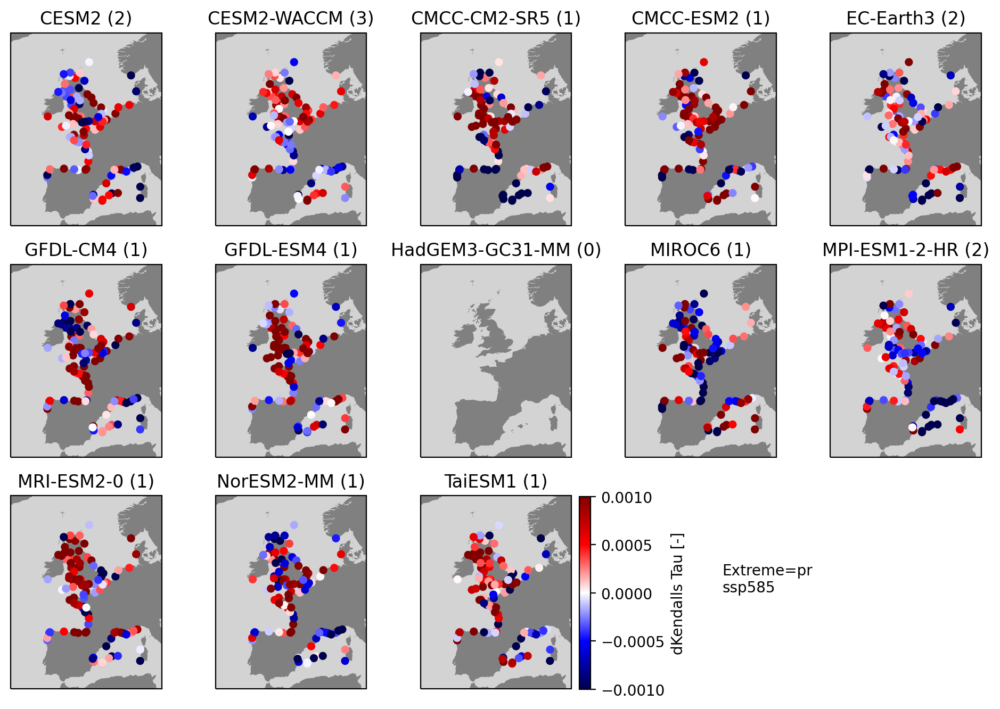

In [11]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.ktau_slope.sel(source_id=model).sel(statistic='coef',extreme_variate='pr').mean(dim='member_id'),cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.ktau.sel(source_id=model).isel(tg=0,extreme_variate=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dKendalls Tau [-]')
            ax.annotate('Extreme=pr\n'+ssp,(2,.5),xycoords='axes fraction')
        

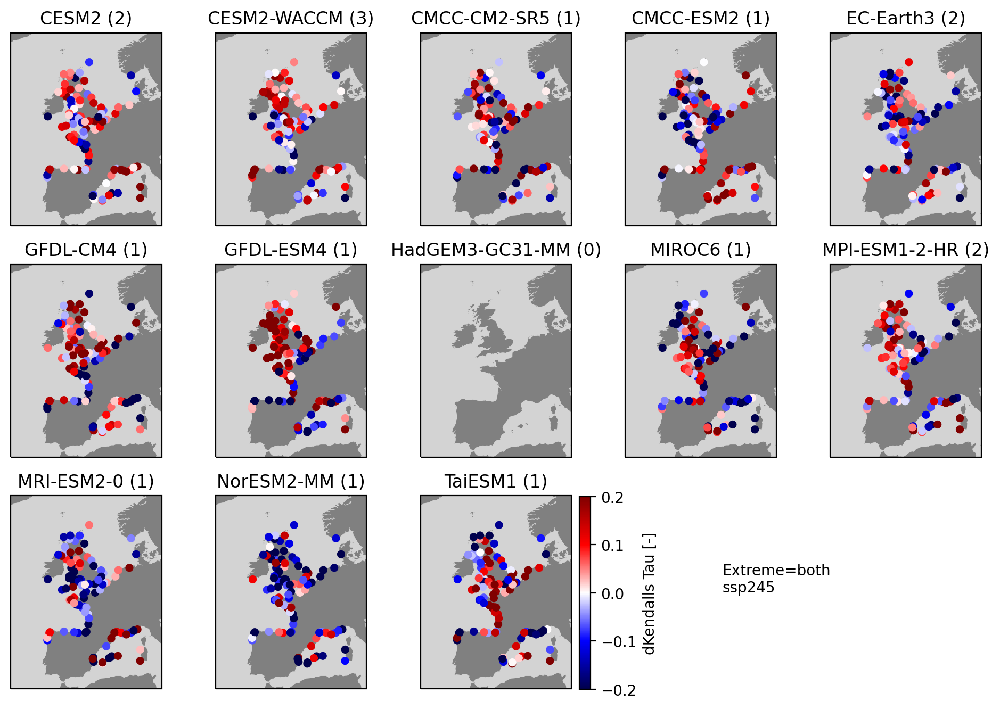

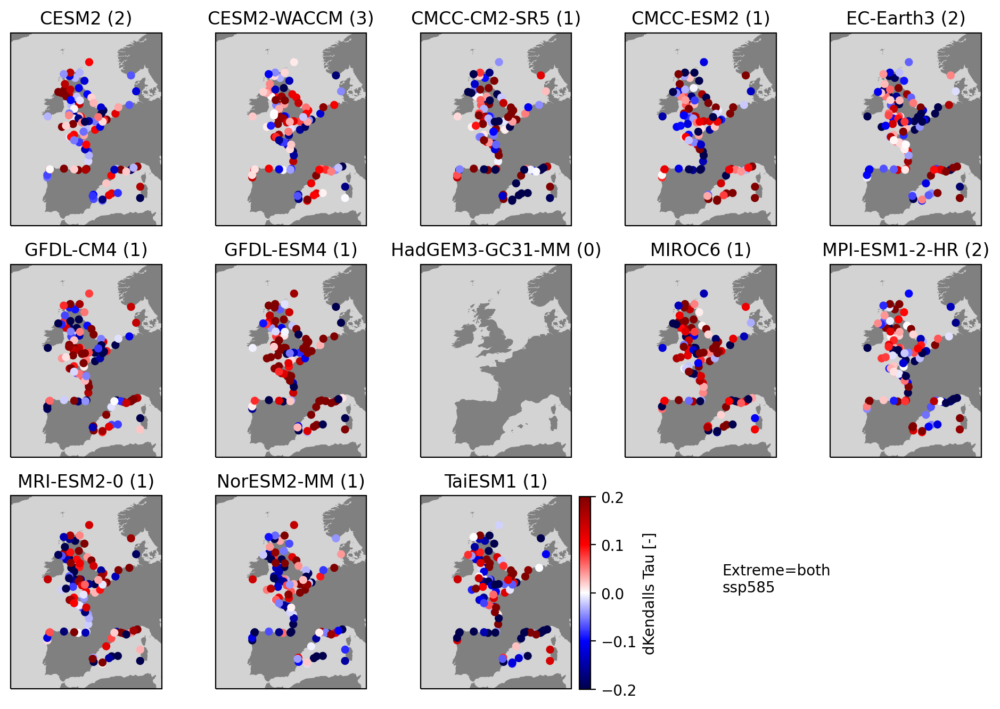

In [12]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_diff.ktau.sel(source_id=model).sel(statistic='coef',extreme_variate='both').mean(dim='member_id'),cmap='seismic',vmin=-.2,vmax=.2,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.ktau.sel(source_id=model).isel(tg=0,extreme_variate=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dKendalls Tau [-]')
            ax.annotate('Extreme=both\n'+ssp,(2,.5),xycoords='axes fraction')

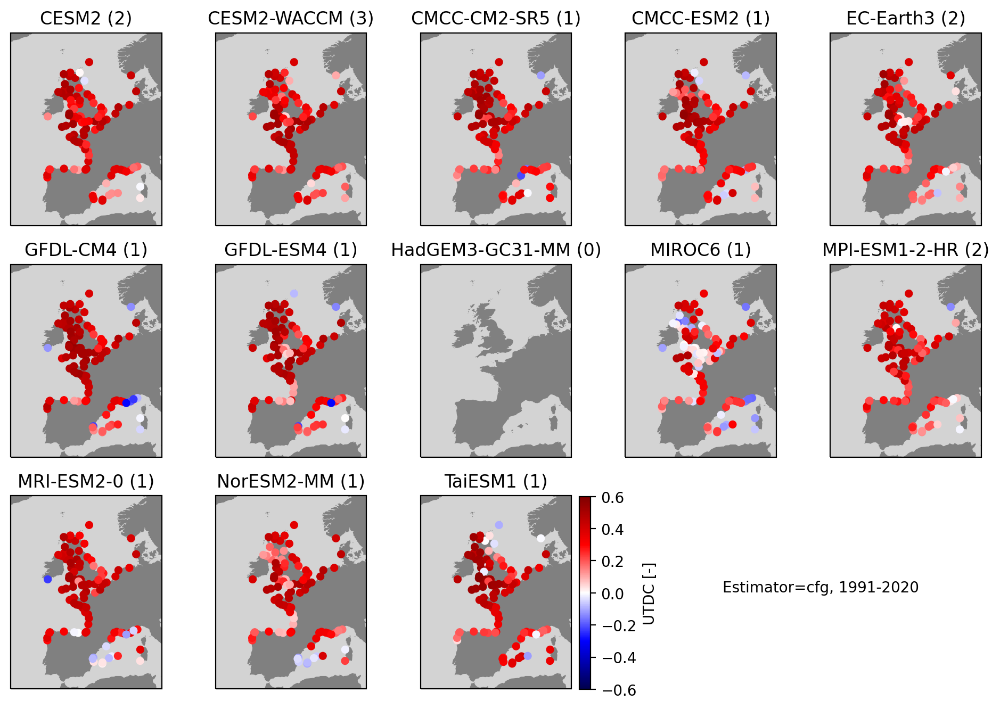

In [13]:
for ssp in ['ssp245']:#ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_present.utdc.sel(source_id=model).sel(statistic='coef',estimator='cfg').mean(dim='member_id'),cmap='seismic',vmin=-.6,vmax=.6,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='UTDC [-]')
            ax.annotate('Estimator=cfg, 1991-2020',(2,.5),xycoords='axes fraction')
        

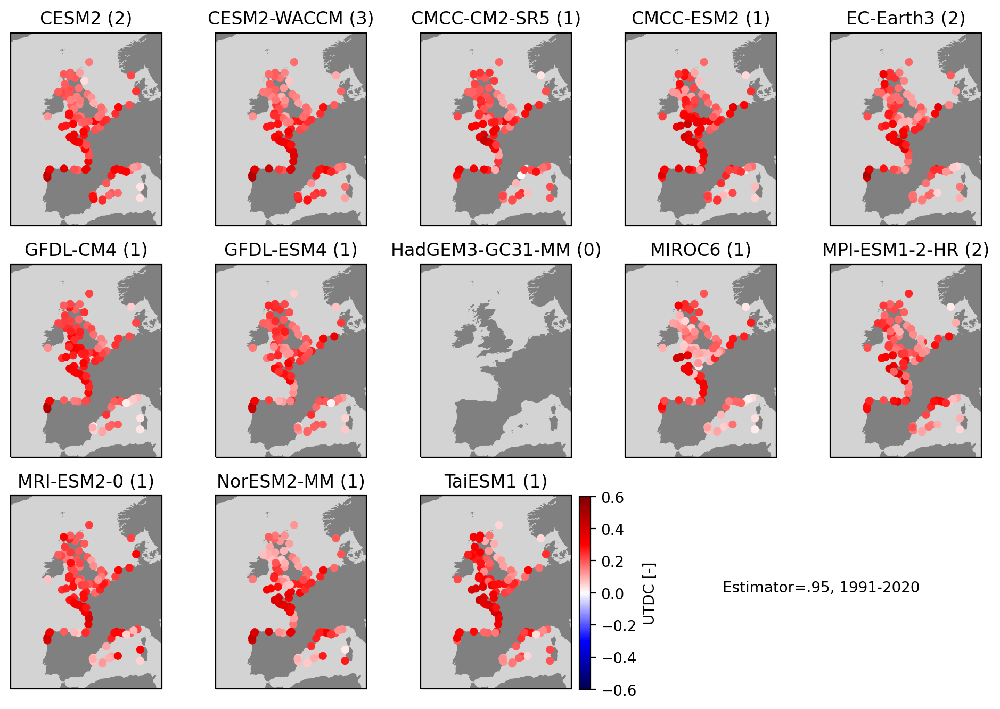

In [14]:
for ssp in ['ssp245']:#ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_present.utdc.sel(source_id=model).sel(statistic='coef',estimator='.95').mean(dim='member_id'),cmap='seismic',vmin=-.6,vmax=.6,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='UTDC [-]')
            ax.annotate('Estimator=.95, 1991-2020',(2,.5),xycoords='axes fraction')
        

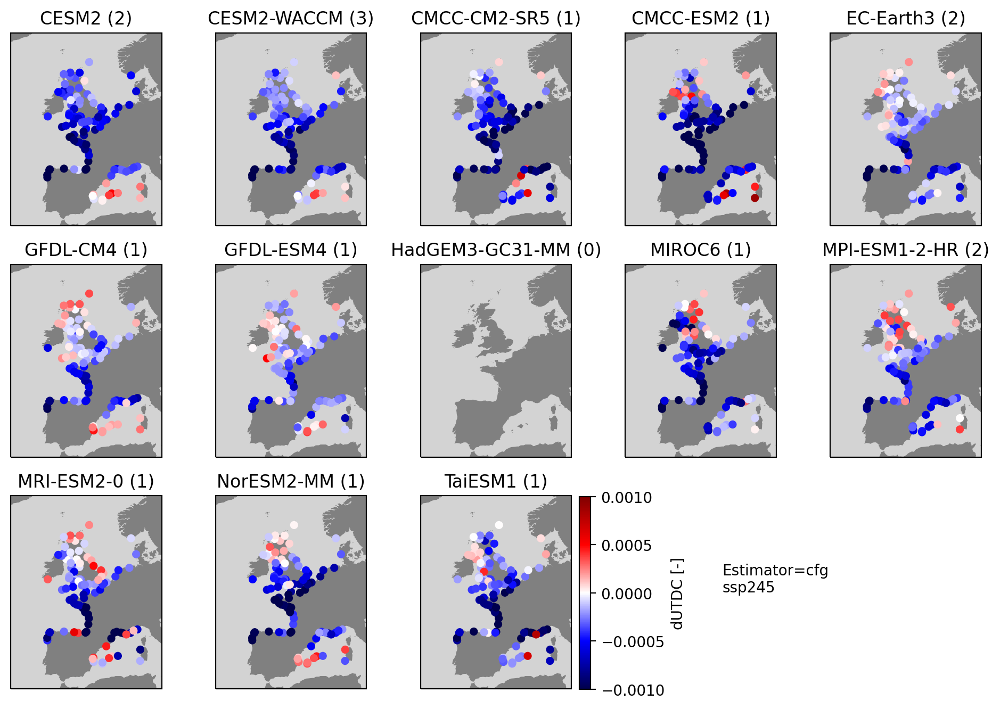

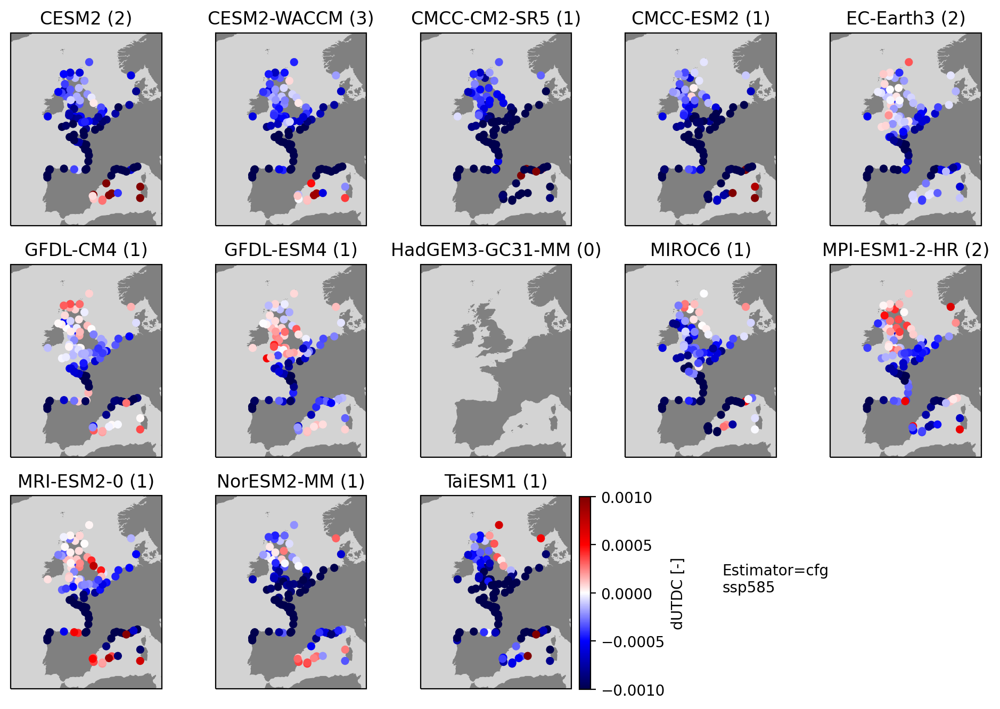

In [15]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.utdc_slope.sel(source_id=model).sel(statistic='coef',estimator='cfg').mean(dim='member_id'),cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dUTDC [-]')
            ax.annotate('Estimator=cfg\n'+ssp,(2,.5),xycoords='axes fraction')

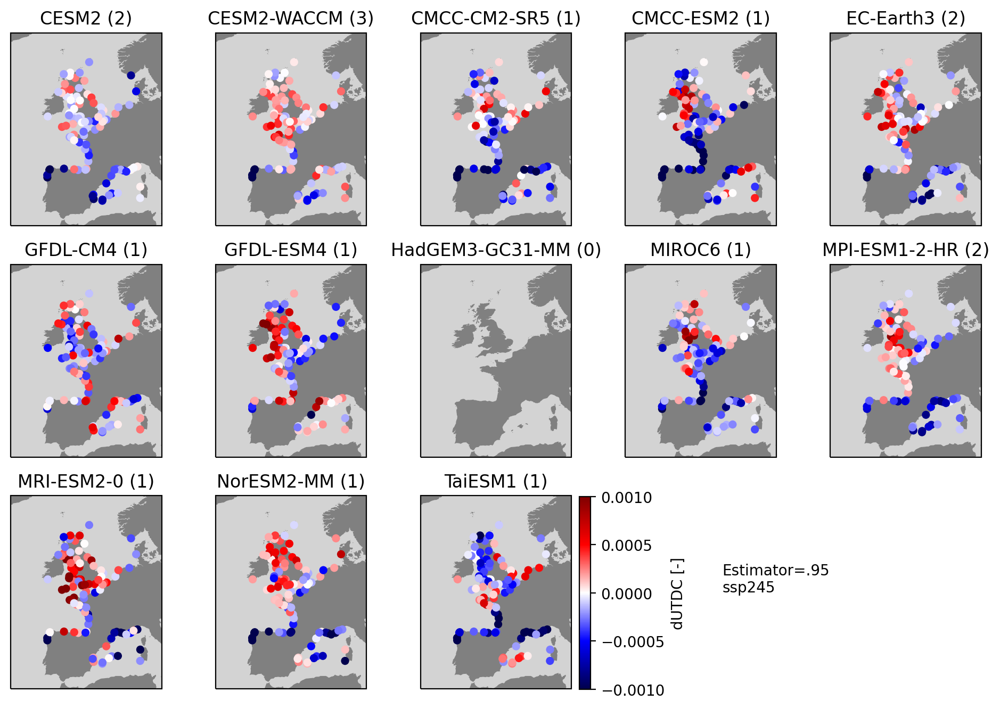

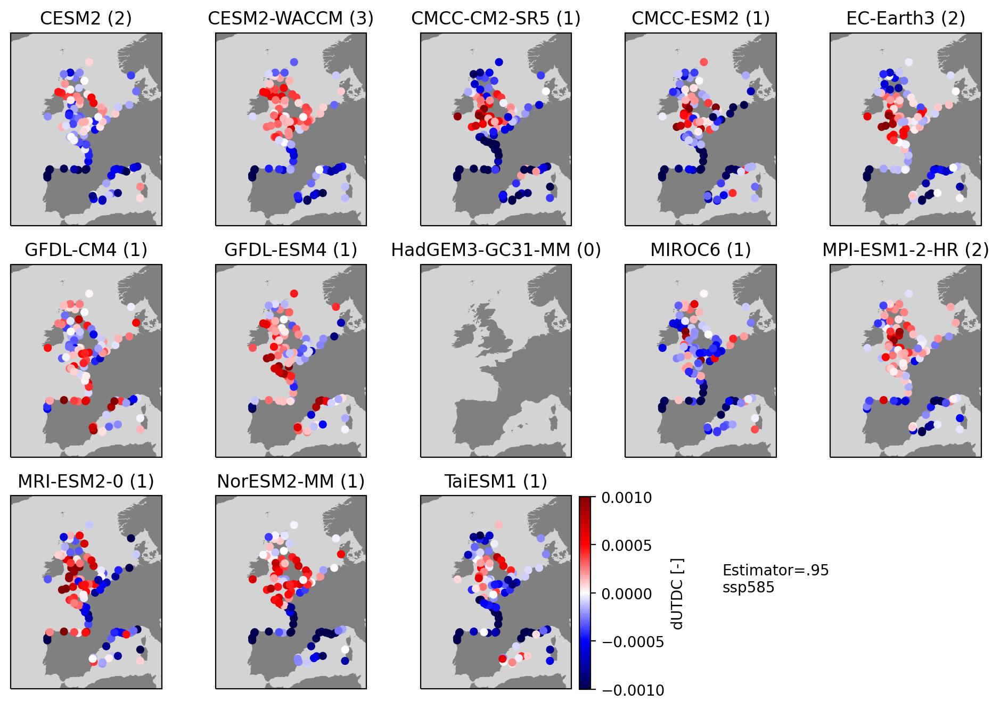

In [16]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.utdc_slope.sel(source_id=model).sel(statistic='coef',estimator='.95').mean(dim='member_id'),cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dUTDC [-]')
            ax.annotate('Estimator=.95\n'+ssp,(2,.5),xycoords='axes fraction')

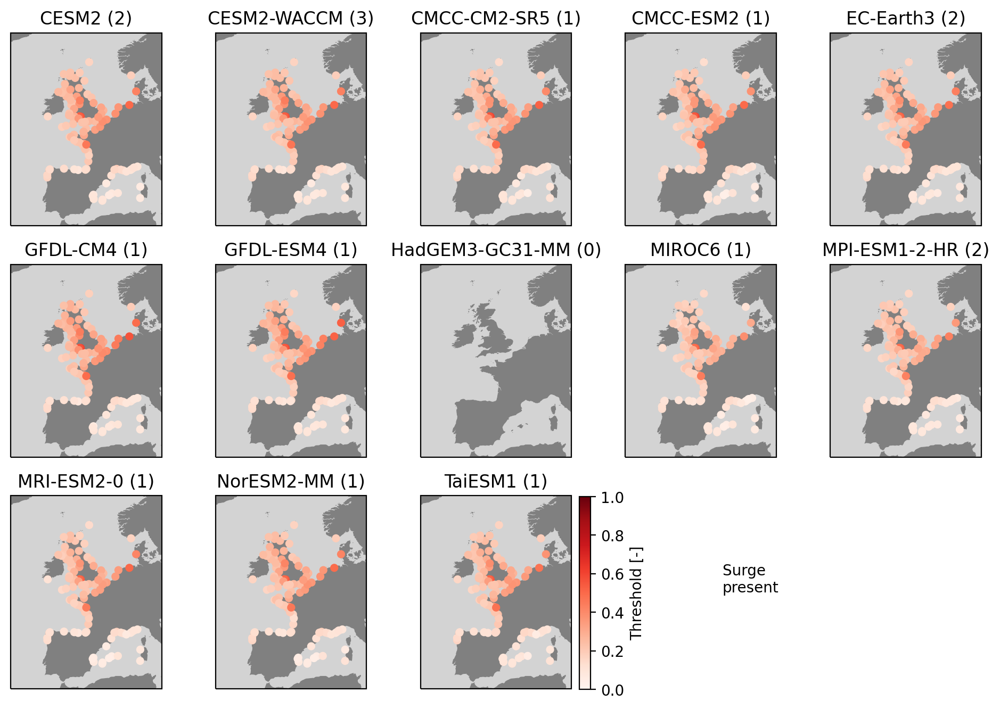

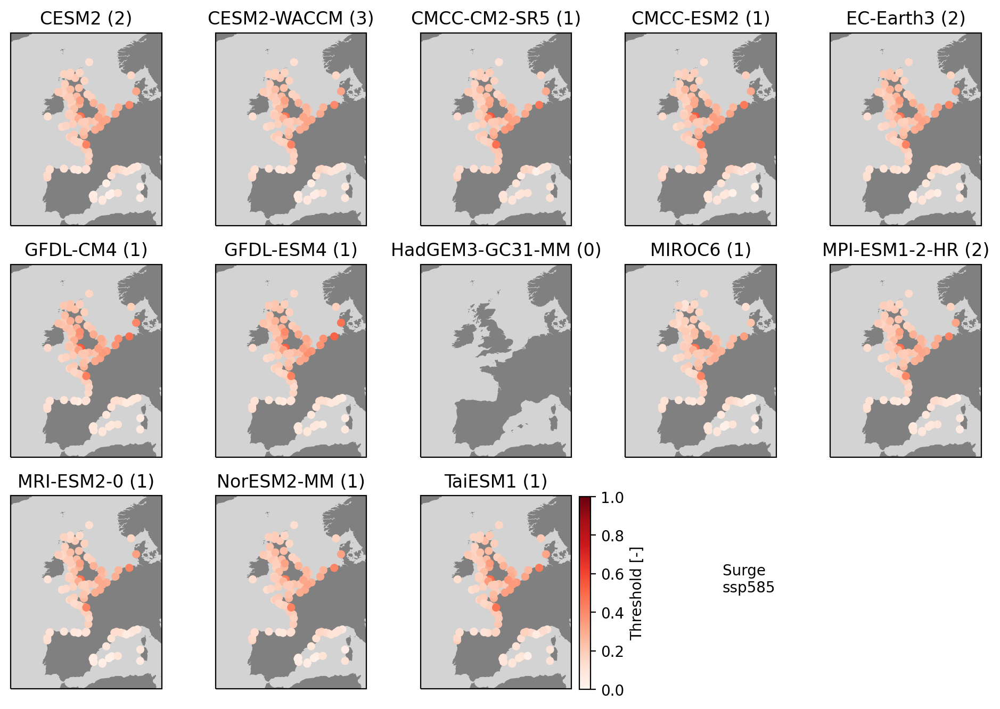

In [17]:
for s,ssp in enumerate(ssps):
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.sel(window=[2000,2080][s]).surge_thresholds.sel(source_id=model).isel(quantile=-3).mean(dim='member_id'),vmin=0,vmax=1,cmap='Reds',s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='Threshold [-]')
            ax.annotate('Surge \n'+['present','ssp585'][s],(2,.5),xycoords='axes fraction')

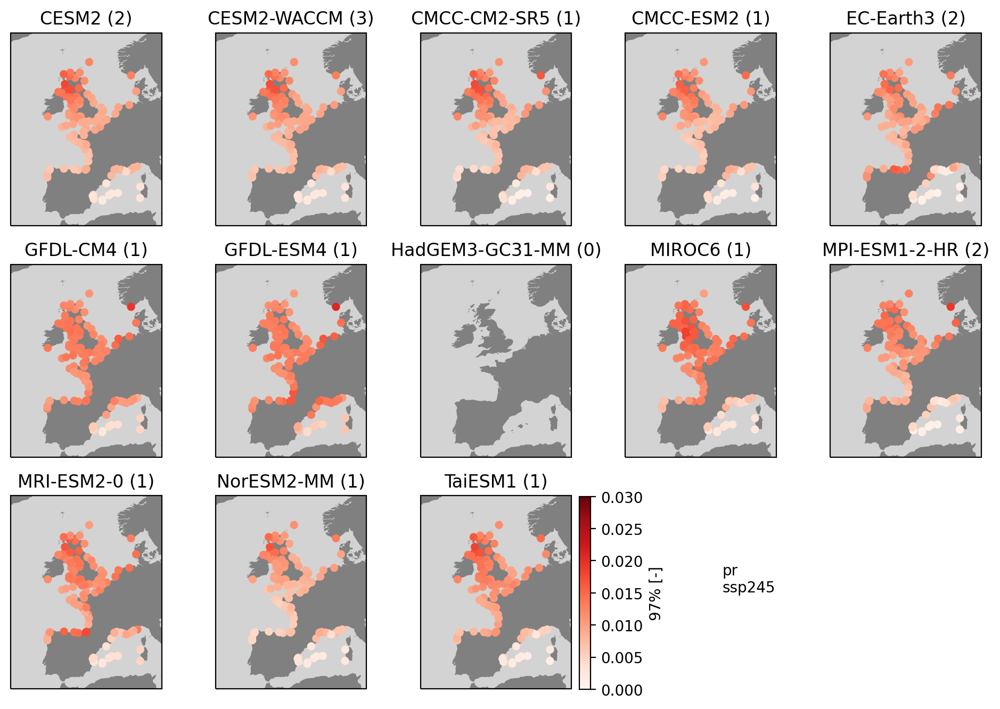

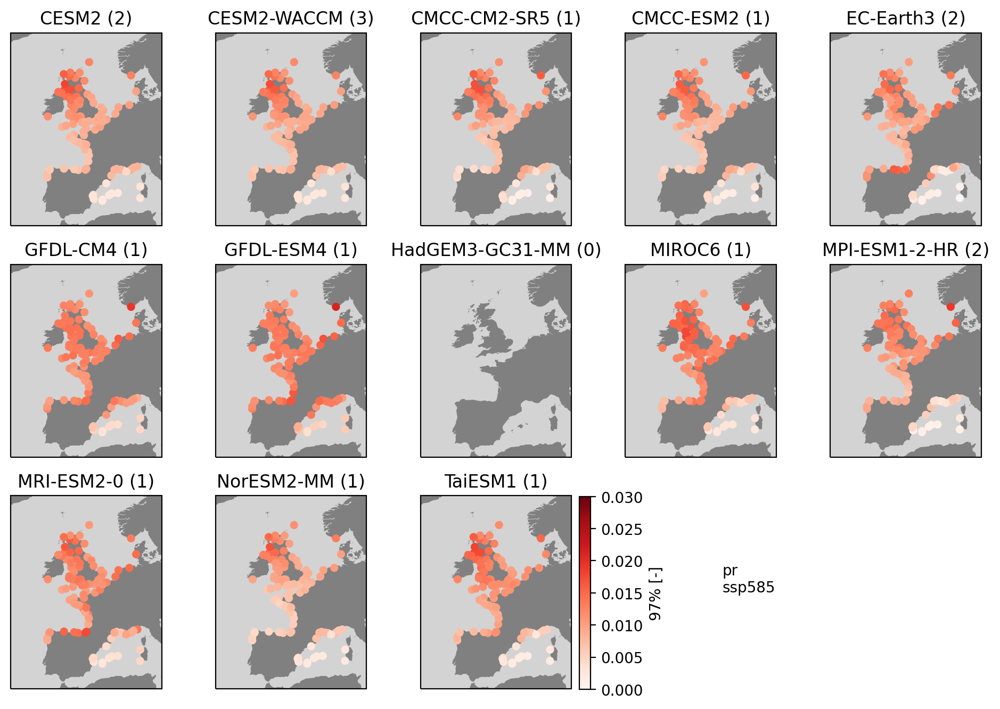

In [18]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_present.pr_thresholds.sel(source_id=model).isel(quantile=-3).mean(dim='member_id'),cmap='Reds',vmin=0,vmax=.03,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='97% [-]')
            ax.annotate('pr\n'+ssp,(2,.5),xycoords='axes fraction')

AttributeError: 'Dataset' object has no attribute 'surge_threshold'

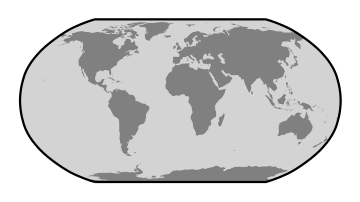

In [19]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_diff.surge_threshold.sel(source_id=model).mean(dim='member_id'),cmap='seismic',vmin=-.1,vmax=.1,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
            ax.annotate('surge\n'+ssp,(2,.5),xycoords='axes fraction')

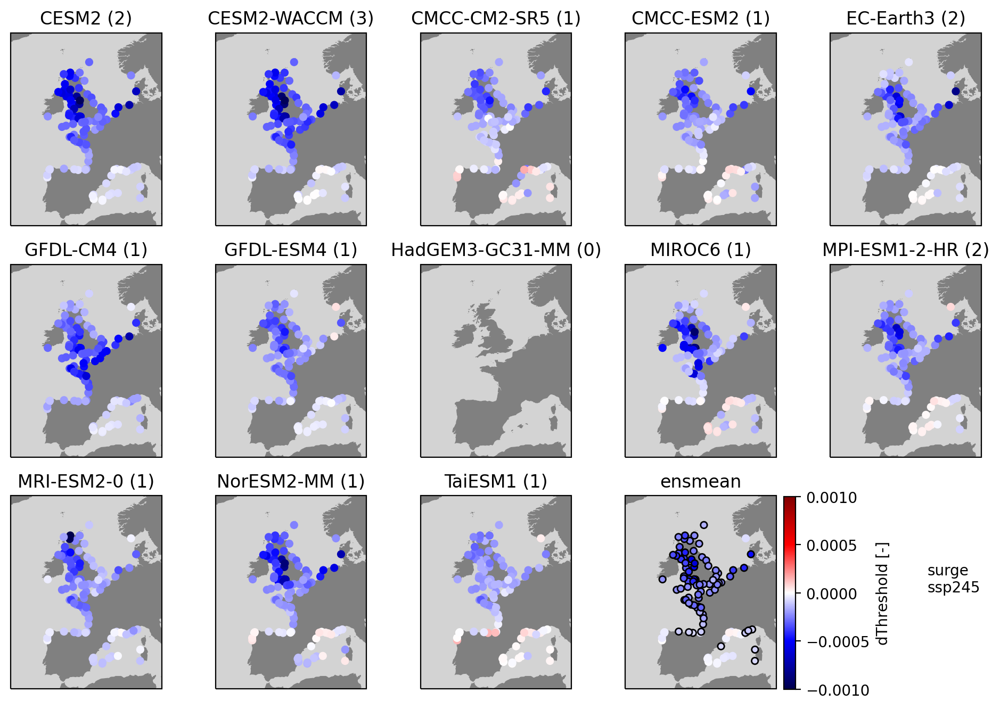

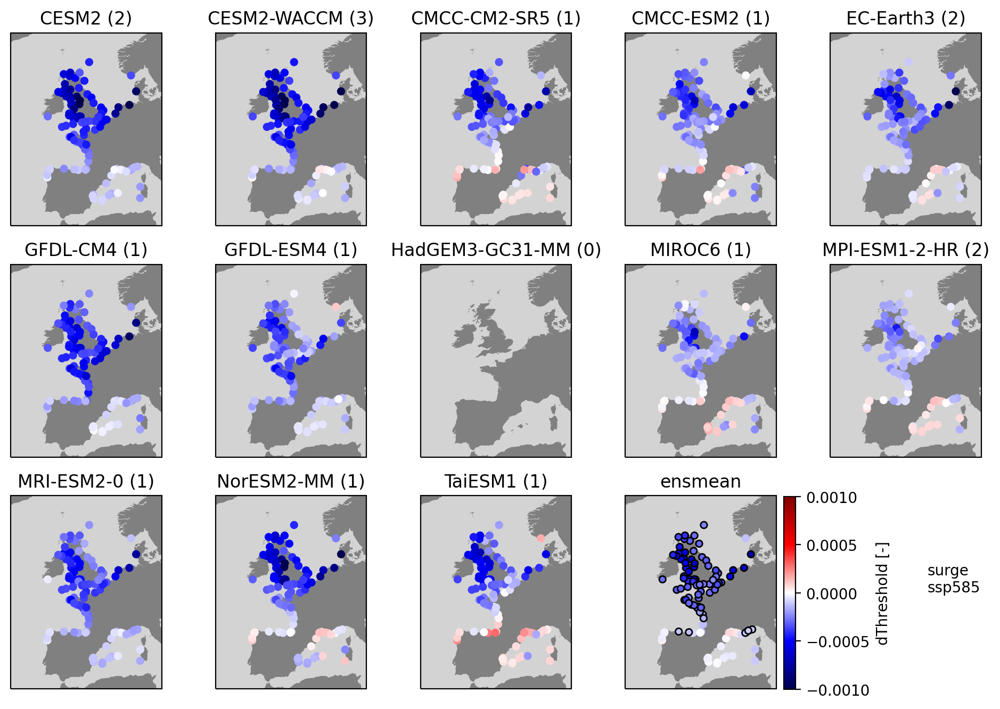

In [22]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.surge_thresholds_slope.sel(source_id=model).isel(quantile=-5).mean(dim='member_id'),cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        '''
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
            ax.annotate('surge\n'+ssp,(2,.5),xycoords='axes fraction')
        '''
            
            
    ax = plt.subplot(gs[np.unravel_index(m+1,(3,5))],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

    
    cv = ssp_ds.surge_thresholds_slope.isel(quantile=-5).mean(dim='member_id').std(dim='source_id')/ssp_ds.surge_thresholds_slope.isel(quantile=-5).mean(dim='member_id').mean(dim='source_id')
    
    significant = np.abs(cv)<1
    
    sc=ax.scatter(ssp_ds.lon[~significant],ssp_ds.lat[~significant],c=ssp_ds.surge_thresholds_slope.isel(quantile=-5).mean(dim='member_id').mean(dim='source_id')[~significant],cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
    sc=ax.scatter(ssp_ds.lon[significant],ssp_ds.lat[significant],c=ssp_ds.surge_thresholds_slope.isel(quantile=-5).mean(dim='member_id').mean(dim='source_id')[significant],cmap='seismic',vmin=-.001,vmax=.001,s=20,edgecolor='black',transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
    
    ax.set_title('ensmean')
   
    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
    ax.annotate('surge\n'+ssp,(2,.5),xycoords='axes fraction')

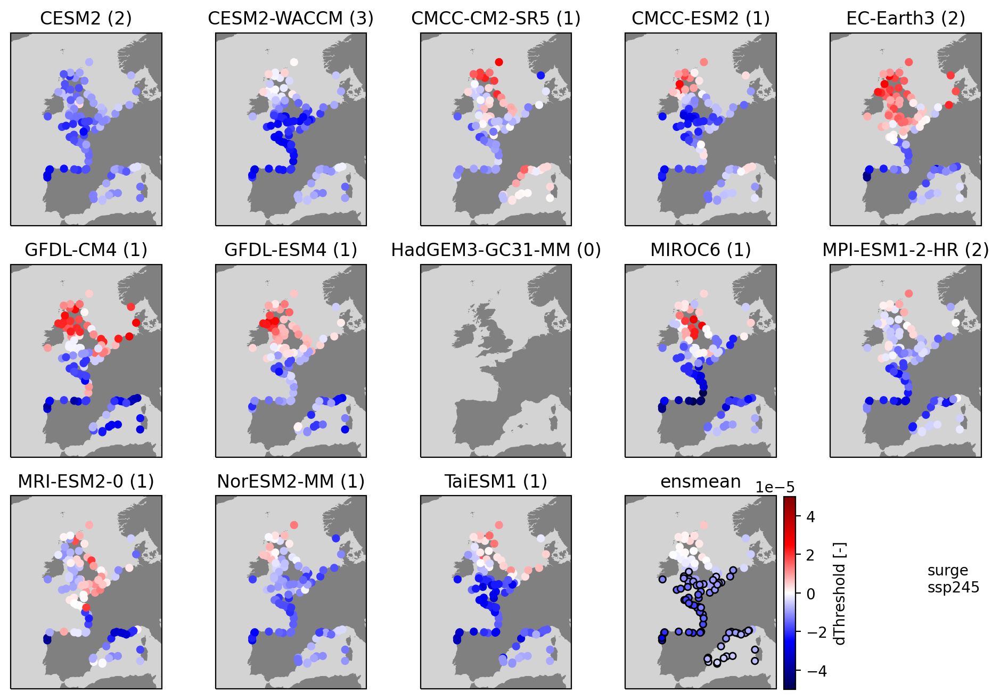

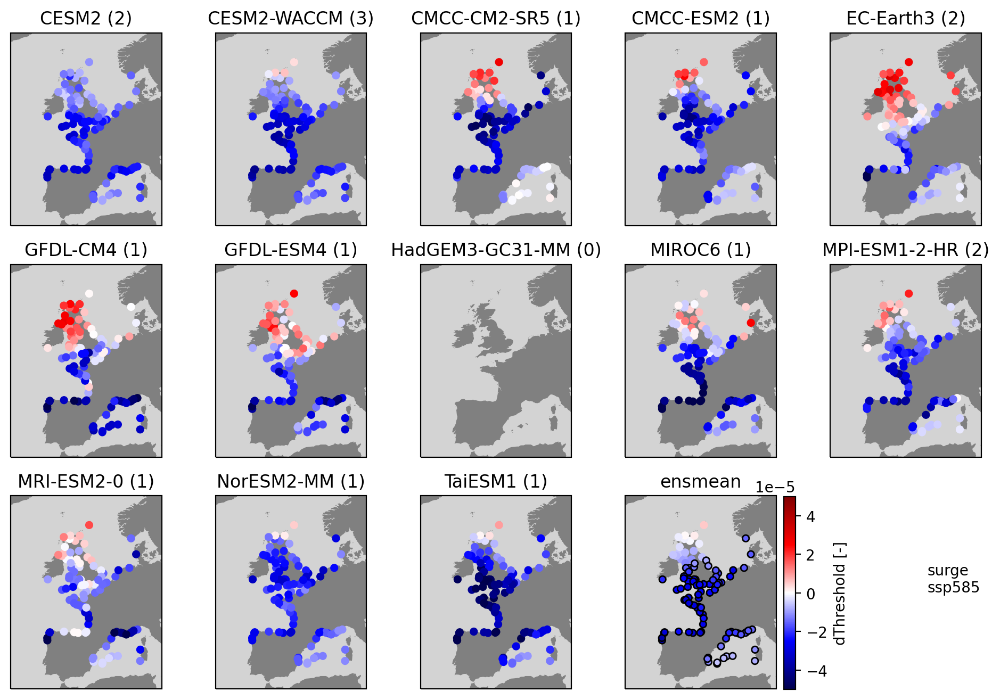

In [20]:
for ssp in ssps:
    ssp_ds = ds_intersect.sel(ssp=ssp)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,model in enumerate(ssp_ds.source_id.values):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.pr_thresholds_slope.sel(source_id=model).isel(quantile=-3).mean(dim='member_id'),cmap='seismic',vmin=-.00005,vmax=.00005,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        n_members = np.isfinite(ssp_ds_present.utdc.sel(source_id=model).isel(tg=0,estimator=0,statistic=0)).sum(dim='member_id').values
        ax.set_title(model +' ('+str(n_members)+')')
        '''
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
            ax.annotate('pr\n'+ssp,(2,.5),xycoords='axes fraction')
        '''
    ax = plt.subplot(gs[np.unravel_index(m+1,(3,5))],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

    
    cv = ssp_ds.pr_thresholds_slope.isel(quantile=-5).mean(dim='member_id').std(dim='source_id')/ssp_ds.pr_thresholds_slope.isel(quantile=-5).mean(dim='member_id').mean(dim='source_id')
    
    significant = np.abs(cv)<1
    sc=ax.scatter(ssp_ds.lon[~significant],ssp_ds.lat[~significant],c=ssp_ds.pr_thresholds_slope.isel(quantile=-5).mean(dim='member_id').mean(dim='source_id')[~significant],cmap='seismic',vmin=-.00005,vmax=.00005,s=20,transform=ccrs.PlateCarree(),zorder=3)
    sc=ax.scatter(ssp_ds.lon[significant],ssp_ds.lat[significant],c=ssp_ds.pr_thresholds_slope.isel(quantile=-5).mean(dim='member_id').mean(dim='source_id')[significant],cmap='seismic',vmin=-.00005,vmax=.00005,s=20,edgecolor='black',transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
    
    ax.set_title('ensmean')
   
    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
    ax.annotate('surge\n'+ssp,(2,.5),xycoords='axes fraction')

Plot indivdual members of a model:

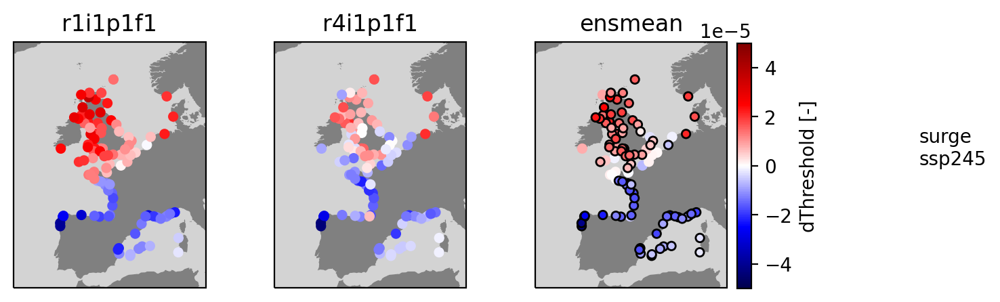

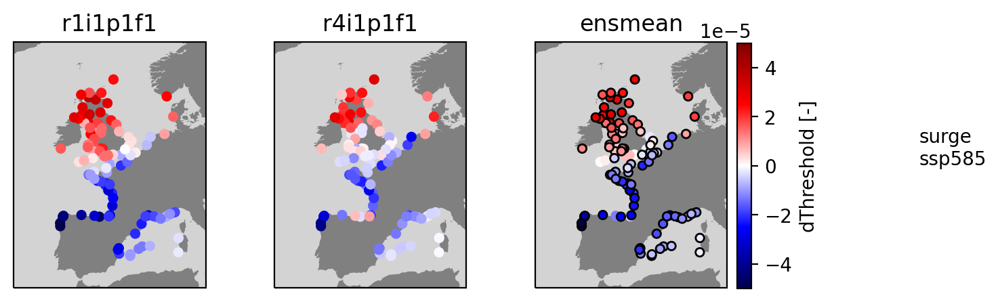

In [21]:
model='EC-Earth3'
idx=np.where(np.isfinite(ds_intersect.sel(source_id=model).ktau.isel(tg=0,window=-1,statistic=0,extreme_variate=0,ssp=0)))[0]
for ssp in ssps:
    ssp_ds = ds_intersect.isel(member_id=idx).sel(ssp=ssp,source_id=model)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,member in enumerate(ssp_ds.member_id):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.pr_thresholds_slope.isel(quantile=-3).sel(member_id=member),cmap='seismic',vmin=-.00005,vmax=.00005,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        
        ax.set_title(member.values)
        '''
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
            ax.annotate('pr\n'+ssp,(2,.5),xycoords='axes fraction')
        '''
    ax = plt.subplot(gs[np.unravel_index(m+1,(3,5))],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

    
    cv = ssp_ds.pr_thresholds_slope.isel(quantile=-5).std(dim='member_id')/ssp_ds.pr_thresholds_slope.isel(quantile=-3).mean(dim='member_id')
    
    significant = np.abs(cv)<1
    sc=ax.scatter(ssp_ds.lon[~significant],ssp_ds.lat[~significant],c=ssp_ds.pr_thresholds_slope.isel(quantile=-3).mean(dim='member_id')[~significant],cmap='seismic',vmin=-.00005,vmax=.00005,s=20,transform=ccrs.PlateCarree(),zorder=3)
    sc=ax.scatter(ssp_ds.lon[significant],ssp_ds.lat[significant],c=ssp_ds.pr_thresholds_slope.isel(quantile=-3).mean(dim='member_id')[significant],cmap='seismic',vmin=-.00005,vmax=.00005,s=20,edgecolor='black',transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
    
    ax.set_title('ensmean')
   
    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
    ax.annotate('surge\n'+ssp,(2,.5),xycoords='axes fraction')

In [ ]:
model='CESM2'
idx=np.where(np.isfinite(ds_intersect.sel(source_id=model).ktau.isel(tg=0,window=-1,statistic=0,extreme_variate=0,ssp=0)))[0]
for ssp in ssps:
    ssp_ds = ds_intersect.isel(member_id=idx).sel(ssp=ssp,source_id=model)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,member in enumerate(ssp_ds.member_id):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds.surge_thresholds_slope.isel(quantile=-3).sel(member_id=member),cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        
        ax.set_title(member.values)
        '''
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
            ax.annotate('pr\n'+ssp,(2,.5),xycoords='axes fraction')
        '''
    ax = plt.subplot(gs[np.unravel_index(m+1,(3,5))],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

    
    cv = ssp_ds.pr_thresholds_slope.isel(quantile=-5).std(dim='member_id')/ssp_ds.surge_thresholds_slope.isel(quantile=-3).mean(dim='member_id')
    
    significant = np.abs(cv)<1
    sc=ax.scatter(ssp_ds.lon[~significant],ssp_ds.lat[~significant],c=ssp_ds.surge_thresholds_slope.isel(quantile=-3).mean(dim='member_id')[~significant],cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
    sc=ax.scatter(ssp_ds.lon[significant],ssp_ds.lat[significant],c=ssp_ds.surge_thresholds_slope.isel(quantile=-3).mean(dim='member_id')[significant],cmap='seismic',vmin=-.001,vmax=.001,s=20,edgecolor='black',transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
    
    ax.set_title('ensmean')
   
    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
    ax.annotate('surge\n'+ssp,(2,.5),xycoords='axes fraction')

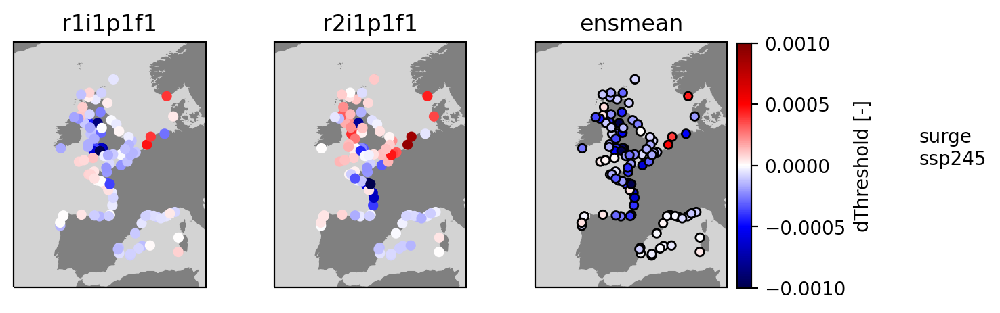

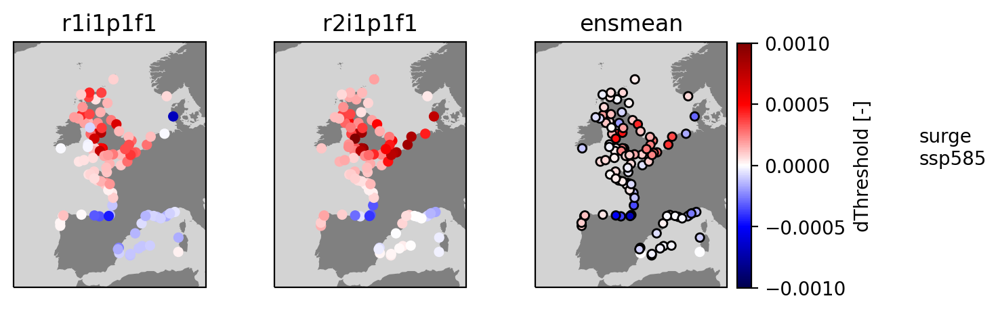

In [110]:
model='MPI-ESM1-2-HR'
idx=np.where(np.isfinite(ds_intersect.sel(source_id=model).ktau.isel(tg=0,window=-1,statistic=0,extreme_variate=0,ssp=0)))[0]
for ssp in ssps:
    ssp_ds = ds_intersect.isel(member_id=idx).sel(ssp=ssp,source_id=model)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(12,8)) #generate figure  
    gs = fig.add_gridspec(3,5)

    for m,member in enumerate(ssp_ds.member_id):
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(m,(3,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=ssp_ds_diff.surge_thresholds.isel(quantile=-3).sel(member_id=member),cmap='seismic',vmin=-.1,vmax=.1,s=20,transform=ccrs.PlateCarree(),zorder=3)
        ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
        
        ax.set_title(member.values)
        '''
        if m==len(ssp_ds.source_id.values)-1:
            cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
            ax.annotate('pr\n'+ssp,(2,.5),xycoords='axes fraction')
        '''
    ax = plt.subplot(gs[np.unravel_index(m+1,(3,5))],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='lightgrey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

    
    cv = ssp_ds.pr_thresholds_slope.isel(quantile=-5).std(dim='member_id')/ssp_ds.surge_thresholds_slope.isel(quantile=-3).mean(dim='member_id')
    
    significant = np.abs(cv)<1
    sc=ax.scatter(ssp_ds.lon[~significant],ssp_ds.lat[~significant],c=ssp_ds.surge_thresholds_slope.isel(quantile=-3).mean(dim='member_id')[~significant],cmap='seismic',vmin=-.001,vmax=.001,s=20,transform=ccrs.PlateCarree(),zorder=3)
    sc=ax.scatter(ssp_ds.lon[significant],ssp_ds.lat[significant],c=ssp_ds.surge_thresholds_slope.isel(quantile=-3).mean(dim='member_id')[significant],cmap='seismic',vmin=-.001,vmax=.001,s=20,edgecolor='black',transform=ccrs.PlateCarree(),zorder=3)
    ax.set_extent([-15, 12, 35, 65], crs=ccrs.PlateCarree())
    
    ax.set_title('ensmean')
   
    cax=inset_axes(ax,width="100%", height="100%",bbox_to_anchor=(1.1, 0.035,.075,1),bbox_transform=ax.transAxes)
    cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='dThreshold [-]')
    ax.annotate('surge\n'+ssp,(2,.5),xycoords='axes fraction')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]),)